In [3]:
import re
import pandas as pd
import numpy as np
import requests
from bs4 import BeautifulSoup

In [2]:
urls=["""https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=170099&set=true""",
      """https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=180084&set=true""",
     """https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=190075&set=true""",
     """https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=200061&set=true""",
     """https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=210064&set=true""",
     """https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=220069&set=true""",
     """https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=230019&set=true"""]
urls

['https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=170099&set=true',
 'https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=180084&set=true',
 'https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=190075&set=true',
 'https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=200061&set=true',
 'https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%

In [3]:
for i in urls:
    print(i)

https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=170099&set=true
https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=180084&set=true
https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=190075&set=true
https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=200061&set=true
https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=7

In [4]:
page2 = requests.get(i,headers = {'User-Agent':'Mozilla/5.0'}) # ---> use code to get "< response 200 >"
soup = BeautifulSoup(page2.text)

In [5]:
name=[]
age=[]
rating=[]
performance=[]
team=[]
Contract=[]
value=[]
wage=[]

# requesting websites:

#url = 'https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=170099&set=true'
for i in urls:
    
    print(i)
    page2 = requests.get(i,headers = {'User-Agent':'Mozilla/5.0'}) # ---> use code to get "< response 200 >"
    soup = BeautifulSoup(page2.text)


    # Names:
    a = soup.find_all('div',class_="ellipsis")
    for i in a:
        name.append(i.text.strip()) # ---> to remove spaces
        b = name[0::2] # ----> index slicing & naming with a variable

    # Age:
    c = soup.find_all('td',class_="col col-ae")
    for i in c:
        age.append(i.text)

    # Overall Rating:
    d = soup.find_all('td',class_="col col-oa col-sort")
    for i in d:
        rating.append(i.text)

    # Potential:
    e = soup.find_all('td',class_="col col-pt")
    for i in e:
        performance.append(i.text)

    # Team:
    f = soup.find_all("td",class_="col-name")[1].text 
    z = name[1::2]
    team = [re.findall(r'^\w+(?: \w+)*', d)[0] for d in z]   # ----> using regular expression

    # Contract:
    h = name[1::2]  # ----> index slicing & naming with a variable
    contract=[re.findall(r'\d+\s~\s\d+',str(h))]
    Contract=contract[0]
    # contract = [re.findall(r'\d{4}', d)[0] for d in h]  # ----> using regular expression

    # Value:
    j = soup.find_all('td',class_="col col-vl")
    for i in j:
        i = i.text.replace('€','')
        if 'M' in i:
            i = float(i.replace('M','')) * 1000000
        elif 'K' in i:
            i = float(i.replace('K','')) * 1000
        value.append(i)
    # for i in j:
    #     value.append(i.text.replace('€',''))  # -----> replacing " € " with " "



    # Wage:
    m = soup.find_all('td',class_="col col-wg")
    for i in m:
        i = i.text.replace('€','')
        if 'M' in i:
            i = float(i.replace('M','')) * 1000000
        elif 'K' in i:
            i = float(i.replace('K','')) * 1000
        wage.append(i)
    
    print("Name---->",len(b))
    print("Age---->",len(age))
    print("Rating---->",len(rating))
    print("Potential---->",len(performance))
    print("Team---->",len(team))
    print("Contract---->",len(Contract))
    print("Value---->",len(value))
    print("Wage---->",len(wage))

https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=170099&set=true
Name----> 60
Age----> 60
Rating----> 60
Potential----> 60
Team----> 60
Contract----> 60
Value----> 60
Wage----> 60
https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=180084&set=true
Name----> 120
Age----> 120
Rating----> 120
Potential----> 120
Team----> 120
Contract----> 118
Value----> 120
Wage----> 120
https://sofifa.com/players?type=all&tm%5B0%5D=1&tm%5B1%5D=5&tm%5B2%5D=9&tm%5B3%5D=11&tm%5B4%5D=69&tm%5B5%5D=66&tm%5B6%5D=219&tm%5B7%5D=73&tm%5B8%5D=45&tm%5B9%5D=241&tm%5B10%5D=243&tm%5B11%5D=112139&r=190075&set=true
Name----> 180
Age----> 180
Rating----> 180
Potential----> 180
Team----> 180
Contract----> 177
Value----> 180
Wage-

In [6]:
Contract.insert(105,"2018 ~ 2021")
Contract.insert(106,"2018 ~ 2021")
Contract.insert(108,"2018 ~ 2021")
Contract.insert(109,"2018 ~ 2021")
Contract.insert(110,"2018 ~ 2021")


In [7]:
len(Contract)

420

In [8]:
dd = {'Name':b,
    'Age':age,
    'Team':team,
    'Contract':Contract,
    'Overall_Rating':rating,
    'Potential':performance,
    'Value':value,
    'Wage':wage}

In [9]:
d=pd.DataFrame(dd)
d

,Name,Age,Team,Contract,Overall_Rating,Potential,Value,Wage
0,Cristiano Ronaldo,31,Real Madrid,2009 ~ 2021,94,94,87000000.0,575000.0
1,L. Messi,29,FC Barcelona,2004 ~ 2018,93,93,89000000.0,575000.0
2,Neymar,24,FC Barcelona,2013 ~ 2021,92,94,106000000.0,450000.0
3,L. Suárez,29,FC Barcelona,2014 ~ 2021,92,92,83000000.0,525000.0
4,Z. Ibrahimović,34,Manchester United,2016 ~ 2018,90,90,36500000.0,300000.0
...,...,...,...,...,...,...,...,...
415,F. Kostić,29,Juventus,2022 ~ 2026,84,84,41500000.0,150000.0
416,A. Hakimi,23,Paris Saint Germain,2021 ~ 2026,84,87,53500000.0,90000.0
417,Sergio Ramos,36,Paris Saint Germain,2021 ~ 2023,84,84,7500000.0,75000.0
418,R. James,22,Chelsea,2017 ~ 2028,84,88,57000000.0,120000.0


In [10]:
d["Name"].unique()

array(['Cristiano Ronaldo', 'L. Messi', 'Neymar', 'L. Suárez',
       'Z. Ibrahimović', 'De Gea', 'G. Bale', 'L. Modrić', 'T. Courtois',
       'Thiago Silva', 'Sergio Ramos', 'E. Hazard', 'G. Higuaín',
       'M. Özil', 'P. Pogba', 'Iniesta', 'P. Čech', 'A. Sánchez',
       'G. Buffon', 'G. Chiellini', 'Pepe', 'T. Kroos', 'L. Bonucci',
       'J. Rodríguez', 'Piqué', 'I. Rakitić', 'K. Benzema', 'Marcelo',
       'Coutinho', 'Sergio Busquets', 'Cesc Fàbregas', 'Á. Di María',
       'E. Cavani', 'H. Mkhitaryan', 'M. Verratti', 'Diego Costa',
       'Jordi Alba', 'C. Marchisio', 'P. Dybala', 'A. Barzagli',
       'K. Navas', 'A. Lacazette', 'L. Koscielny', 'Santi Cazorla',
       'B. Matuidi', 'Isco', 'Juan Mata', 'Willian', 'D. Payet',
       'M. Pjanić', 'R. Varane', 'Alex Sandro', 'D. Subašić', 'K. Glik',
       'Dani Alves', 'M. Benatia', 'A. Turan', 'S. Khedira',
       'J. Mascherano', 'Carvajal', 'N. Kanté', 'P. Aubameyang',
       'M. Salah', 'M. ter Stegen', 'Azpilicueta', 'Case

Markdown:

1. This dataframe is formed from (2017 - 2023) by providing only 1st page from every year.
2. In this data some players data has been re-used in different years based on their performance.

In [11]:
### To convert data frame into ['CSV','EXCEL',etc..,]

In [12]:
# d.to_csv("fifa_players.csv")

In [6]:
d=pd.read_csv("/Users/Challa/Documents/Batch211/Numpy & Pandas/my projects/fifa_players.csv")


d.drop("Unnamed: 0",axis=1,inplace=True)


d

,Name,Age,Team,Contract,Overall_Rating,Potential,Value,Wage
0,Cristiano Ronaldo,31,Real Madrid,2009 ~ 2021,94,94,87000000.0,575000.0
1,L. Messi,29,FC Barcelona,2004 ~ 2018,93,93,89000000.0,575000.0
2,Neymar,24,FC Barcelona,2013 ~ 2021,92,94,106000000.0,450000.0
3,L. Suárez,29,FC Barcelona,2014 ~ 2021,92,92,83000000.0,525000.0
4,Z. Ibrahimović,34,Manchester United,2016 ~ 2018,90,90,36500000.0,300000.0
...,...,...,...,...,...,...,...,...
415,F. Kostić,29,Juventus,2022 ~ 2026,84,84,41500000.0,150000.0
416,A. Hakimi,23,Paris Saint Germain,2021 ~ 2026,84,87,53500000.0,90000.0
417,Sergio Ramos,36,Paris Saint Germain,2021 ~ 2023,84,84,7500000.0,75000.0
418,R. James,22,Chelsea,2017 ~ 2028,84,88,57000000.0,120000.0


In [7]:
d['Name']=d['Name'].astype('str')
d['Age']=d['Age'].astype('int')
d['Team']=d['Team'].astype('str')
d['Contract']=d['Contract'].astype('str')
d['Overall_Rating']=d['Overall_Rating'].astype('int')
d['Potential']=d['Potential'].astype('int')
d['Value']=d['Value'].astype('float')
d['Wage']=d['Wage'].astype('float')

In [8]:
d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420 entries, 0 to 419
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Name            420 non-null    object 
 1   Age             420 non-null    int64  
 2   Team            420 non-null    object 
 3   Contract        420 non-null    object 
 4   Overall_Rating  420 non-null    int64  
 5   Potential       420 non-null    int64  
 6   Value           420 non-null    float64
 7   Wage            420 non-null    float64
dtypes: float64(2), int64(3), object(3)
memory usage: 26.4+ KB


In [4]:
# libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [5]:
import warnings 
warnings.filterwarnings('ignore')

In [55]:
# Consisteny -----> satisfing all years in neutal manner

In [56]:
d['Name'].count()

420

In [57]:
# CountPlot

In [58]:
d.shape

(420, 8)

### no of players age in no of age ---> [ 7 - years]

<AxesSubplot:>

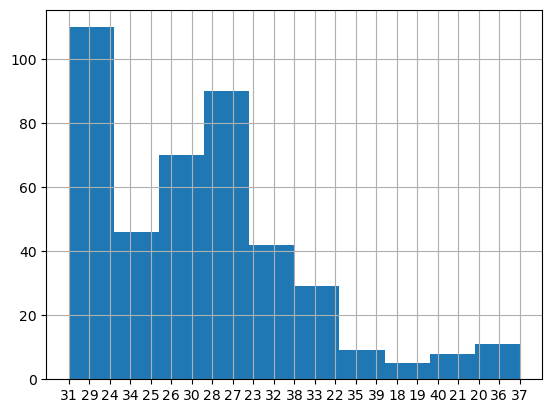

In [59]:
d["Age"].hist()

In [60]:
d['Age'].value_counts()

29    55
28    46
27    44
30    37
25    33
26    33
31    31
24    24
32    22
23    20
33    17
34    13
22    11
35     8
21     7
20     5
36     4
19     3
37     2
18     2
40     1
39     1
38     1
Name: Age, dtype: int64

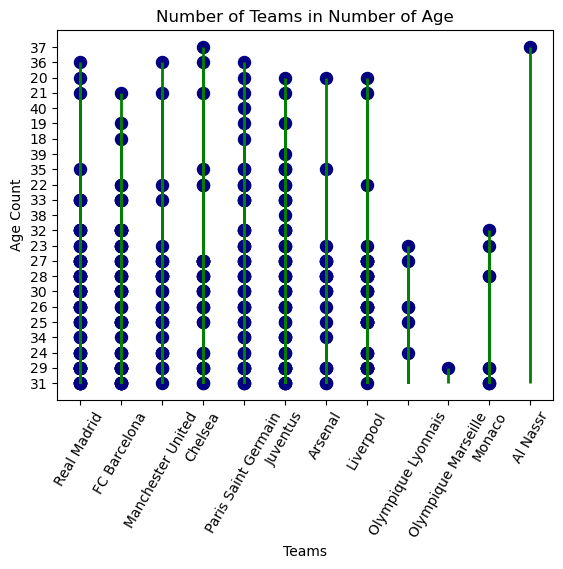

In [61]:
fig,ax = plt.subplots()
ax.vlines(x =d["Team"],ymin = 0 , ymax = d["Age"],color = "Green",linewidth = 2)
ax.scatter(x = d["Team"],y = d["Age"],s = 75,color = "navy")
ax.set_title('Number of Teams in Number of Age')
ax.set_xlabel('Teams')
ax.set_ylabel('Age Count')
plt.xticks(rotation = 60)
plt.show()

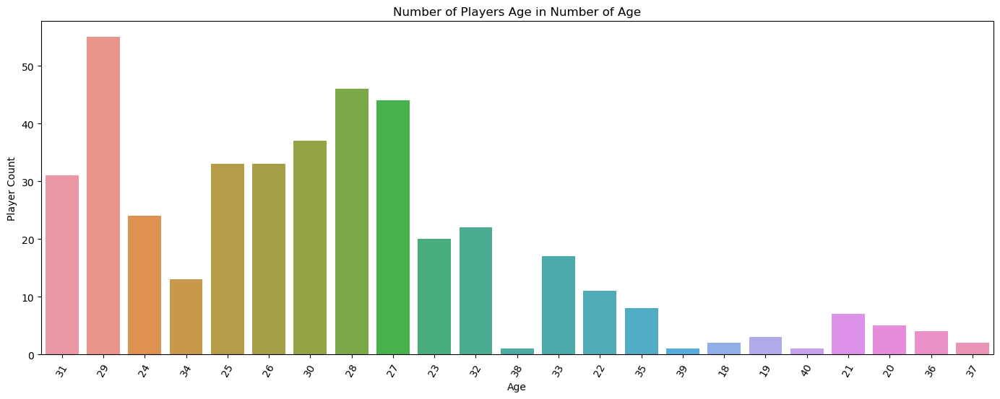

In [62]:
# we wiloli pop plot
plt.figure(figsize = (17,6))
sns.countplot(x = 'Age',data = d)
plt.title('Number of Players Age in Number of Age')
plt.xlabel('Age')
plt.ylabel('Player Count')
plt.xticks(rotation = 60)
plt.show()

Markdown
1. This graph shows the age difference of total players in last 7 - years based on page - 1 details.
2. In this graph some players age as been re-used because of their performance in different years

### no of players repeated in no of times ---> [ 7 - years]

In [63]:
z = pd.DataFrame(d['Name'].value_counts())
z

,Name
Cristiano Ronaldo,7
Sergio Ramos,7
Á. Di María,7
Sergio Busquets,7
R. Varane,7
...,...
Diego Costa,1
M. Icardi,1
H. Ziyech,1
T. Werner,1


In [64]:
d['Name'].value_counts()

Cristiano Ronaldo    7
Sergio Ramos         7
Á. Di María          7
Sergio Busquets      7
R. Varane            7
                    ..
Diego Costa          1
M. Icardi            1
H. Ziyech            1
T. Werner            1
R. James             1
Name: Name, Length: 134, dtype: int64

In [65]:
d['Name'].value_counts()

Cristiano Ronaldo    7
Sergio Ramos         7
Á. Di María          7
Sergio Busquets      7
R. Varane            7
                    ..
Diego Costa          1
M. Icardi            1
H. Ziyech            1
T. Werner            1
R. James             1
Name: Name, Length: 134, dtype: int64

In [66]:
d['Team','Name'].value_counts().plot.bar()

KeyError: ('Team', 'Name')

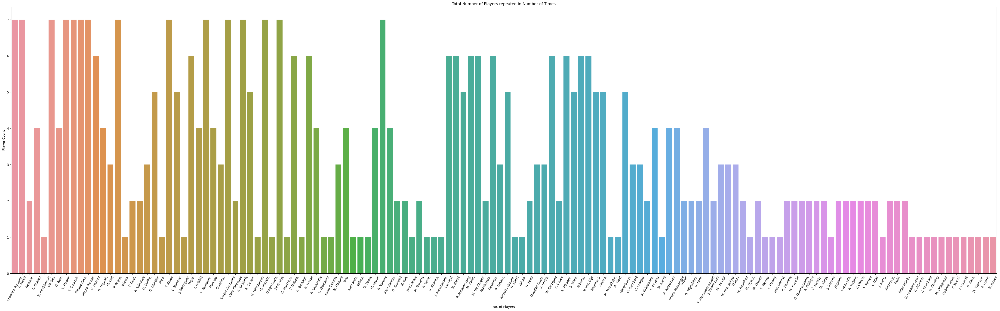

In [67]:
plt.figure(figsize = (55,15))
sns.countplot(x = 'Name',data = d)
plt.title('Total Number of Players repeated in Number of Times')
plt.xlabel('No. of Players')
plt.ylabel('Player Count')
plt.xticks(rotation = 60)
plt.show()

Markdown
1. This graph shows the total number of players from different teams in last 7 - years based on the data.
2. This graph provides the number of players repeated number of times in last 7 - years. 


### no of teams in no of player age ---> [ 7 - years]

In [68]:
d

,Name,Age,Team,Contract,Overall_Rating,Potential,Value,Wage
0,Cristiano Ronaldo,31,Real Madrid,2009 ~ 2021,94,94,87000000.0,575000.0
1,L. Messi,29,FC Barcelona,2004 ~ 2018,93,93,89000000.0,575000.0
2,Neymar,24,FC Barcelona,2013 ~ 2021,92,94,106000000.0,450000.0
3,L. Suárez,29,FC Barcelona,2014 ~ 2021,92,92,83000000.0,525000.0
4,Z. Ibrahimović,34,Manchester United,2016 ~ 2018,90,90,36500000.0,300000.0
...,...,...,...,...,...,...,...,...
415,F. Kostić,29,Juventus,2022 ~ 2026,84,84,41500000.0,150000.0
416,A. Hakimi,23,Paris Saint Germain,2021 ~ 2026,84,87,53500000.0,90000.0
417,Sergio Ramos,36,Paris Saint Germain,2021 ~ 2023,84,84,7500000.0,75000.0
418,R. James,22,Chelsea,2017 ~ 2028,84,88,57000000.0,120000.0


In [69]:
d.groupby(['Team'])['Value'].aggregate(['mean'])

,mean
Team,
Al Nassr,2.700000e+07
Arsenal,4.386957e+07
Chelsea,5.401429e+07
FC Barcelona,5.671324e+07
Juventus,4.338333e+07
Liverpool,6.877358e+07
Manchester United,6.071875e+07
Monaco,2.972222e+07
Olympique Lyonnais,3.825000e+07


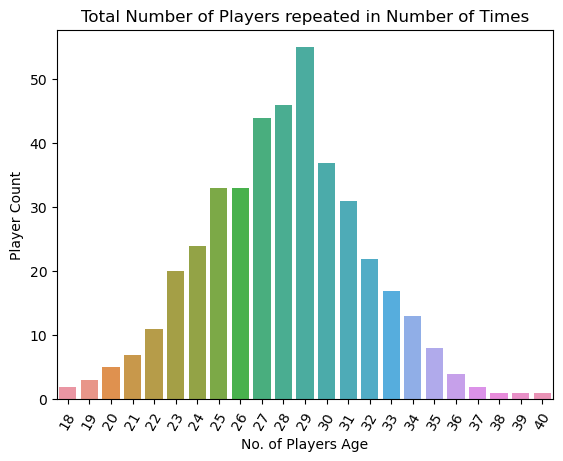

In [13]:
sns.countplot(x = 'Age', data = d)
plt.title('Total Number of Players repeated in Number of Times')
plt.xlabel('No. of Players Age')
plt.ylabel('Player Count')
plt.xticks(rotation = 60)
plt.show()

### no of players played in no of teams ---> [ 7 - years]

In [71]:
d[d['Team']=='Olympique Lyonnais']

,Name,Age,Team,Contract,Overall_Rating,Potential,Value,Wage
41,A. Lacazette,25,Olympique Lyonnais,2009 ~ 2019,85,88,42000000.0,70000.0
106,N. Fekir,23,Olympique Lyonnais,2018 ~ 2021,84,88,40500000.0,90000.0
112,A. Lopes,26,Olympique Lyonnais,2017 ~ 2022,84,86,26000000.0,80000.0
168,A. Lopes,27,Olympique Lyonnais,2017 ~ 2022,85,87,31000000.0,80000.0
177,N. Fekir,24,Olympique Lyonnais,2013 ~ 2022,84,87,39500000.0,80000.0
290,M. Depay,26,Olympique Lyonnais,2018 ~ 2023,84,85,50500000.0,105000.0


In [72]:
d[d['Name']=='L. Messi']

,Name,Age,Team,Contract,Overall_Rating,Potential,Value,Wage
1,L. Messi,29,FC Barcelona,2004 ~ 2018,93,93,89000000.0,575000.0
61,L. Messi,30,FC Barcelona,2004 ~ 2021,94,94,118500000.0,575000.0
121,L. Messi,31,FC Barcelona,2012 ~ 2021,94,94,110500000.0,575000.0
180,L. Messi,32,FC Barcelona,2017 ~ 2022,94,94,95500000.0,560000.0
240,L. Messi,33,Paris Saint Germain,2007 ~ 2022,93,93,103500000.0,320000.0
300,L. Messi,34,Paris Saint Germain,2019 ~ 2024,92,92,69500000.0,290000.0
362,L. Messi,35,Paris Saint Germain,2021 ~ 2023,91,91,54000000.0,195000.0


In [73]:
d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420 entries, 0 to 419
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Name            420 non-null    object 
 1   Age             420 non-null    object 
 2   Team            420 non-null    object 
 3   Contract        420 non-null    object 
 4   Overall_Rating  420 non-null    object 
 5   Potential       420 non-null    object 
 6   Value           420 non-null    float64
 7   Wage            420 non-null    float64
dtypes: float64(2), object(6)
memory usage: 26.4+ KB


In [74]:
sns.boxplot(x = 'Age', y = 'Potential', data = d)

TypeError: Neither the `x` nor `y` variable appears to be numeric.

In [75]:
sns.boxplot(x='Name',y='Age',data=d)

TypeError: Neither the `x` nor `y` variable appears to be numeric.

In [76]:
d[d['Team']=='Al Nassr']

,Name,Age,Team,Contract,Overall_Rating,Potential,Value,Wage
377,Cristiano Ronaldo,37,Al Nassr,2023 ~ 2025,87,87,27000000.0,72000.0


In [77]:
d['Value']

0       87000000.0
1       89000000.0
2      106000000.0
3       83000000.0
4       36500000.0
          ...     
415     41500000.0
416     53500000.0
417      7500000.0
418     57000000.0
419     57500000.0
Name: Value, Length: 420, dtype: float64

In [78]:
a = pd.DataFrame(d['Age'].value_counts())
a

,Age
29,55
28,46
27,44
30,37
25,33
26,33
31,31
24,24
32,22
23,20


In [79]:
d['Team'].value_counts()

Real Madrid            78
FC Barcelona           68
Juventus               60
Paris Saint Germain    54
Liverpool              53
Chelsea                35
Manchester United      32
Arsenal                23
Monaco                  9
Olympique Lyonnais      6
Olympique Marseille     1
Al Nassr                1
Name: Team, dtype: int64

<AxesSubplot:xlabel='Age', ylabel='Count'>

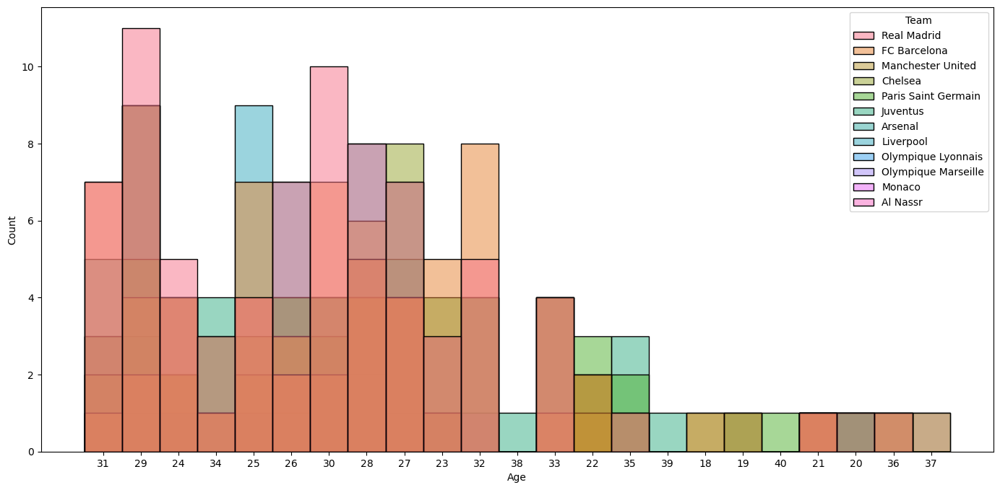

In [80]:
plt.figure(figsize = (17,8))
sns.histplot(x = d["Age"], hue = d["Team"])

<AxesSubplot:>

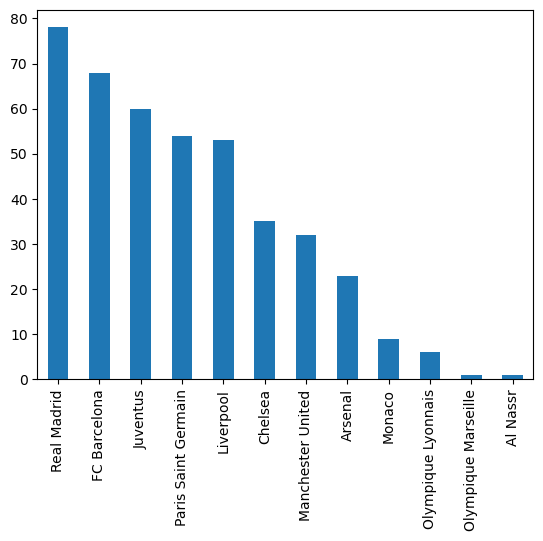

In [81]:
d['Team'].value_counts().plot.bar()

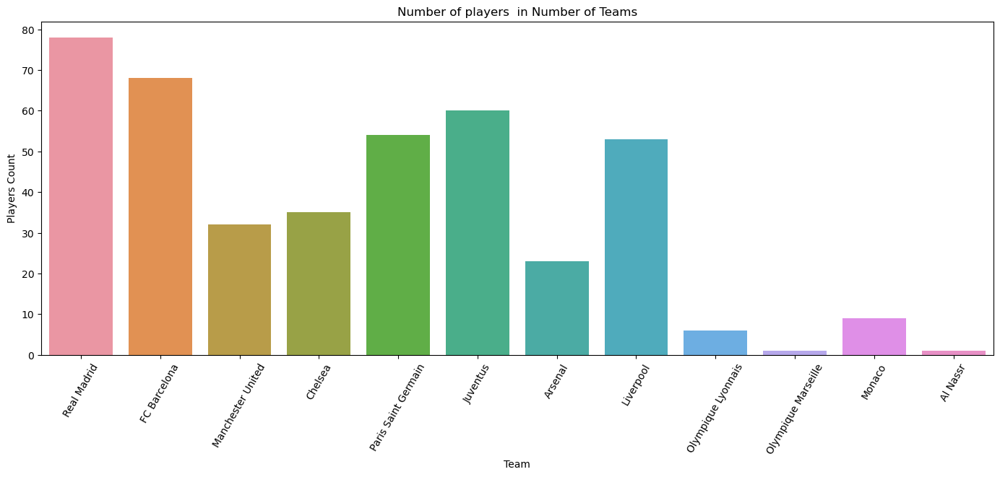

In [82]:
plt.figure(figsize = (17,6))
sns.countplot(x = 'Team',data = d)
plt.title('Number of players  in Number of Teams')
plt.xlabel('Team')
plt.ylabel('Players Count')
plt.xticks(rotation = 60)
plt.show()

Markdown
1. This graph shows the players played in different teams in last 7 - years based on their performance details.
2. This graph provides the existing team players and re - used players from different team which is based on the given data.

In [83]:
# import plotly.express as px
# # This dataframe has 244 lines, but 4 distinct values for `day`
# df = px.data.tips()
# fig = px.pie(df, values='tip', names='day')
# fig.show()

In [9]:
import plotly.express as px
df=px.data.tips()
fig= px.pie(d,"Team")
fig.show()

Markdown
1. This graph shows the players played in different teams in last 7 - years based on their performance details.
2. This graph provides the existing team players and re - used players from different team which is based on the given data.
3. This graph is shown in pie chart.
4. This graph provides values in percentage format.
5. This colours indecates the team names which are shown in legend format.

In [85]:
# # define Seaborn color palette to use

# plt.figure(figsize = (14,20))
# colors = sns.color_palette("Set2")
# # colors = sns.color_palette("rocket")
# # colors = sns.color_palette('GnBu_r')[0:24]# [no of shades]
# plt.pie(a['Team'],labels = a.index,colors=colors, autopct = '%.0f%%')
# plt.title('Number of players played in Number of Teams')
# plt.xticks(rotation = 60)
# plt.show()

### no of players wage ---> [ 7 - years]

In [86]:
df=d.groupby(['Name','Team'])['Wage'].aggregate(['min','max','mean'])
df

min       max           mean
Name           Team                                                  
A. Barzagli    Juventus             120000.0  120000.0  120000.000000
A. Griezmann   FC Barcelona         270000.0  370000.0  320000.000000
A. Hakimi      Paris Saint Germain   90000.0  100000.0   95000.000000
A. Lacazette   Arsenal              140000.0  180000.0  166666.666667
               Olympique Lyonnais    70000.0   70000.0   70000.000000
...                                      ...       ...            ...
Z. Ibrahimović Manchester United    300000.0  300000.0  300000.000000
Á. Di María    Juventus             160000.0  160000.0  160000.000000
               Paris Saint Germain  135000.0  170000.0  150833.333333
É. Mendy       Chelsea              110000.0  140000.0  125000.000000
Éder Militão   Real Madrid          145000.0  160000.0  152500.000000

[162 rows x 3 columns]

In [87]:
log_data = np.log(d['Wage'])
log_data

0      13.262125
1      13.262125
2      13.017003
3      13.171154
4      12.611538
         ...    
415    11.918391
416    11.407565
417    11.225243
418    11.695247
419    11.951180
Name: Wage, Length: 420, dtype: float64

In [88]:
log_data.min(),log_data.max(),log_data.mean()

(10.819778284410283, 13.262125319779487, 12.121559205451641)

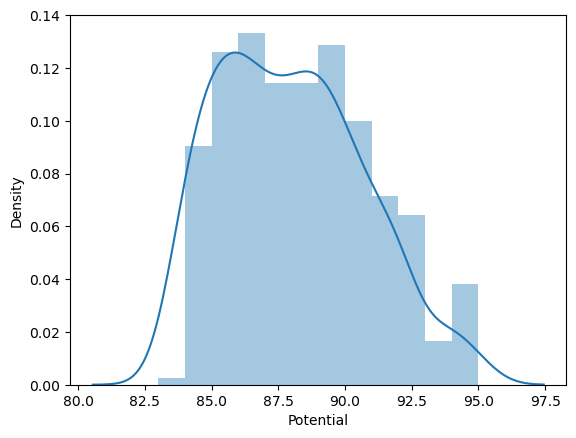

In [89]:
sns.distplot(d['Potential'])
plt.show()

TypeError: ufunc 'true_divide' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

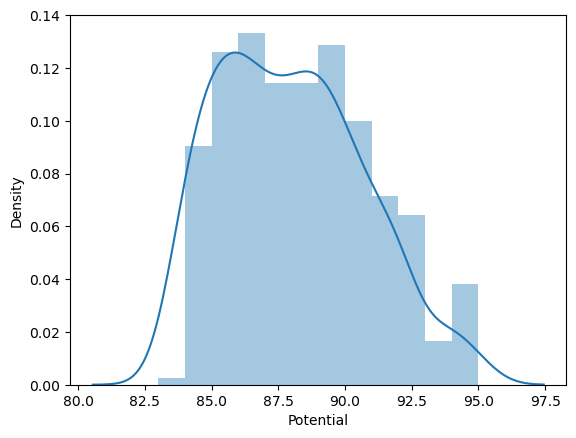

In [90]:
sns.distplot(d['Potential'])
plt.axvline(d['Potential'].mean(),color='red')
plt.axvline(np.median(d['Potential']),color='yellow')
plt.show()

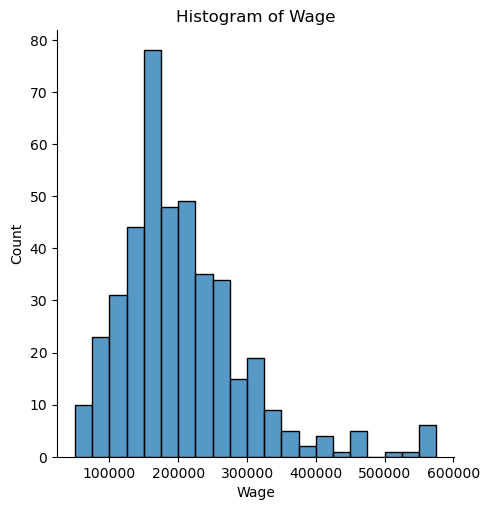

In [91]:
sns.displot(d['Wage'],kde = False)
plt.title('Histogram of Wage')
plt.show()

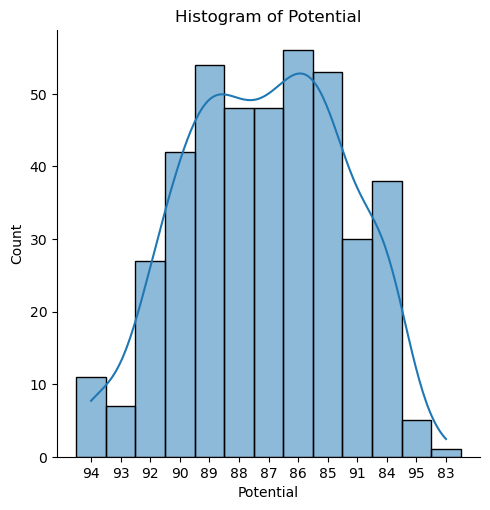

In [92]:
sns.displot(d['Potential'],kde = True)
plt.title('Histogram of Potential')
plt.show()

Markdown
1. This graph shows the players wages which is based on teams recruitment in last 7 - years based on the player performance details.
2. This graph provides the existing team players and re - used players from different team which is based on the given data.
3. This graph shows the Mean & Median values based on the players wages including the outliners.

In [93]:
bins = [0, 25000, 50000, 75000, 100000, 250000, 500000, 750000, 1000000]
df['binned'] = pd.cut(d['Wage'], bins)
print (df)

                                         min       max           mean binned
Name           Team                                                         
A. Barzagli    Juventus             120000.0  120000.0  120000.000000    NaN
A. Griezmann   FC Barcelona         270000.0  370000.0  320000.000000    NaN
A. Hakimi      Paris Saint Germain   90000.0  100000.0   95000.000000    NaN
A. Lacazette   Arsenal              140000.0  180000.0  166666.666667    NaN
               Olympique Lyonnais    70000.0   70000.0   70000.000000    NaN
...                                      ...       ...            ...    ...
Z. Ibrahimović Manchester United    300000.0  300000.0  300000.000000    NaN
Á. Di María    Juventus             160000.0  160000.0  160000.000000    NaN
               Paris Saint Germain  135000.0  170000.0  150833.333333    NaN
É. Mendy       Chelsea              110000.0  140000.0  125000.000000    NaN
Éder Militão   Real Madrid          145000.0  160000.0  152500.000000    NaN

### no of players Value ---> [ 7 - years]

In [94]:
df1 = d.groupby(['Name','Team'])['Value'].aggregate(['min','max','mean'])
df1

min         max          mean
Name           Team                                                     
A. Barzagli    Juventus              6500000.0   6500000.0  6.500000e+06
A. Griezmann   FC Barcelona         68000000.0  69000000.0  6.850000e+07
A. Hakimi      Paris Saint Germain  53500000.0  73000000.0  6.325000e+07
A. Lacazette   Arsenal              32000000.0  41000000.0  3.666667e+07
               Olympique Lyonnais   42000000.0  42000000.0  4.200000e+07
...                                        ...         ...           ...
Z. Ibrahimović Manchester United    36500000.0  36500000.0  3.650000e+07
Á. Di María    Juventus             20500000.0  20500000.0  2.050000e+07
               Paris Saint Germain  30500000.0  63000000.0  4.108333e+07
É. Mendy       Chelsea              28000000.0  52000000.0  4.000000e+07
Éder Militão   Real Madrid          57500000.0  67500000.0  6.250000e+07

[162 rows x 3 columns]

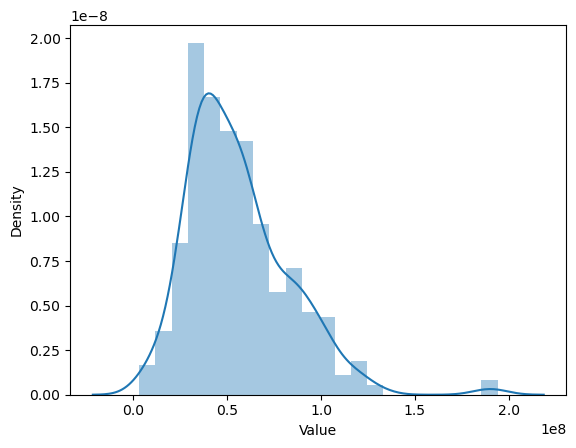

In [95]:
sns.distplot(d['Value'])
plt.show()

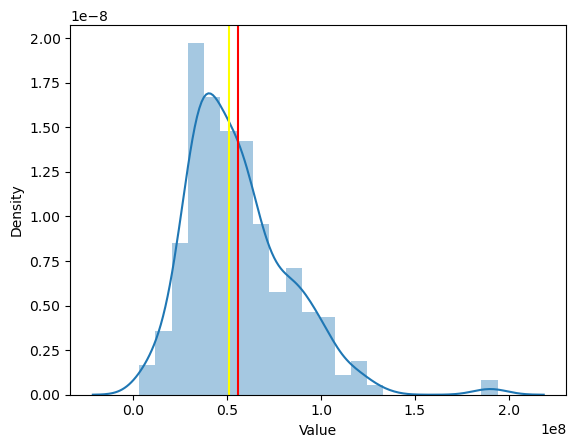

In [96]:
sns.distplot(d['Value'])
plt.axvline(d['Value'].mean(),color='red')
plt.axvline(np.median(d['Value']),color='yellow')
plt.show()

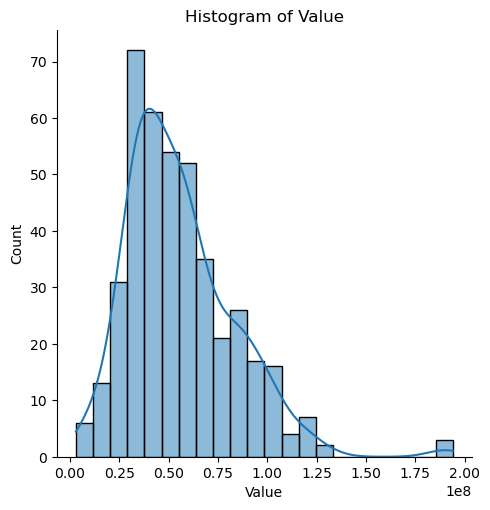

In [97]:
sns.displot(d['Value'],kde = True)
plt.title('Histogram of Value')
plt.show()

### no of players Overall_Rating ---> [ 7 - years]

In [98]:
df2 = d.groupby(['Name','Team'])['Overall_Rating'].aggregate(['min','max','mean'])
df2

min max          mean
Name           Team                                     
A. Barzagli    Juventus             86  86  8.600000e+01
A. Griezmann   FC Barcelona         86  89  4.493000e+03
A. Hakimi      Paris Saint Germain  84  85  4.292000e+03
A. Lacazette   Arsenal              84  85  2.828613e+05
               Olympique Lyonnais   85  85  8.500000e+01
...                                 ..  ..           ...
Z. Ibrahimović Manchester United    90  90  9.000000e+01
Á. Di María    Juventus             84  84  8.400000e+01
               Paris Saint Germain  84  87  1.447476e+11
É. Mendy       Chelsea              84  86  4.342000e+03
Éder Militão   Real Madrid          83  84  4.192000e+03

[162 rows x 3 columns]

In [99]:
d['Overall_Rating']

0      94
1      93
2      92
3      92
4      90
       ..
415    84
416    84
417    84
418    84
419    84
Name: Overall_Rating, Length: 420, dtype: object

In [100]:
np.log(d['Overall_Rating'])

TypeError: loop of ufunc does not support argument 0 of type str which has no callable log method

In [31]:
log_data1 = np.log(d['Overall_Rating'])
log_data1

TypeError: loop of ufunc does not support argument 0 of type str which has no callable log method

In [32]:
sns.distplot(d['Overall_Rating'])
plt.show()

NameError: name 'sns' is not defined

In [33]:
d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420 entries, 0 to 419
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Name            420 non-null    object 
 1   Age             420 non-null    object 
 2   Team            420 non-null    object 
 3   Contract        420 non-null    object 
 4   Overall_Rating  420 non-null    object 
 5   Potential       420 non-null    object 
 6   Value           420 non-null    float64
 7   Wage            420 non-null    float64
dtypes: float64(2), object(6)
memory usage: 26.4+ KB


TypeError: ufunc 'true_divide' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

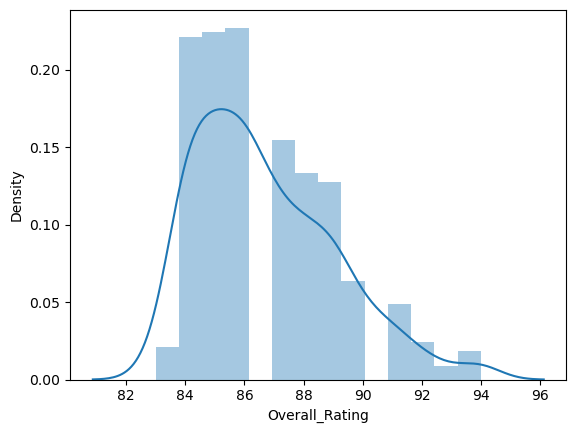

In [105]:
sns.distplot(d['Overall_Rating'])
plt.axvline(d['Overall_Rating'].mean(),color='red')
plt.axvline(np.median(d['Overall_Rating']),color='yellow')
plt.show()

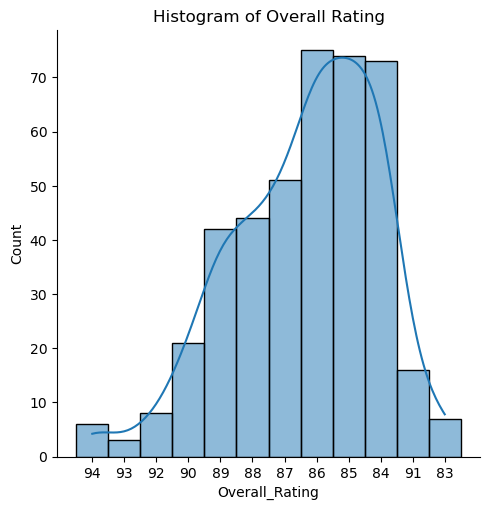

In [106]:
sns.displot(d['Overall_Rating'],kde = True)
plt.title('Histogram of Overall Rating')
plt.show()

### no of players (wage,value,overall rating) ---> [ 7 - years]

<AxesSubplot:xlabel='Wage', ylabel='Value'>

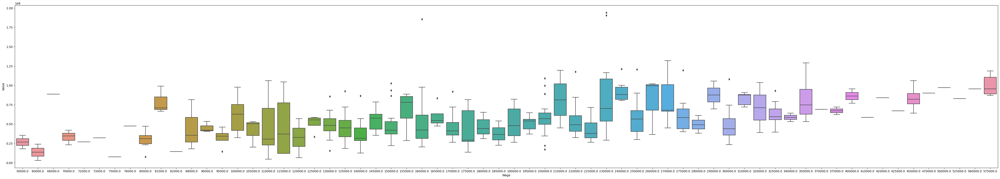

In [107]:
plt.figure(figsize = (60,10))
sns.boxplot(x = 'Wage', y = 'Value', data = d)

<Figure size 6000x400 with 0 Axes>

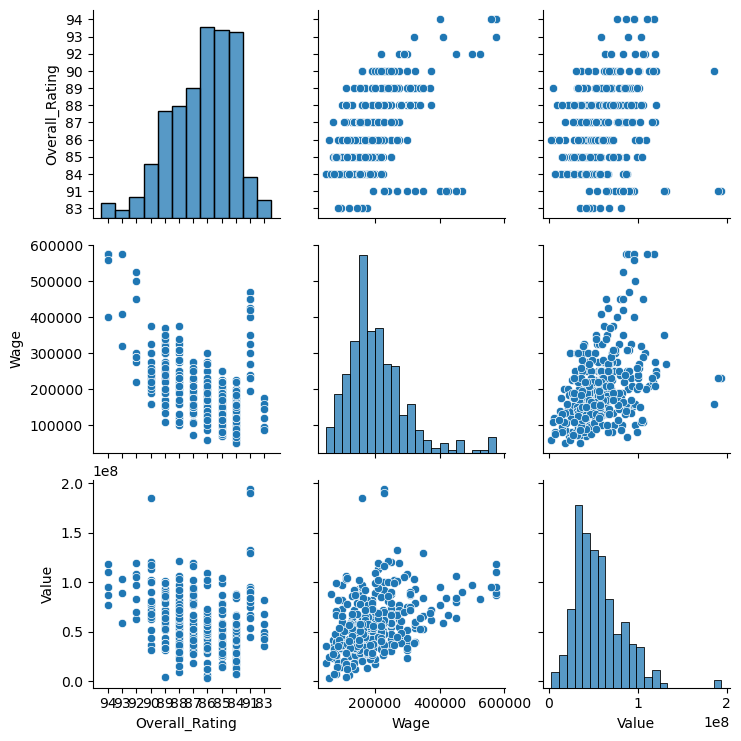

In [108]:
plt.figure(figsize = (60,4))
sns.pairplot(data=d, vars=['Overall_Rating','Wage','Value'])
plt.show()

Markdown
1. This graph shows the players data which is based on teams recruitment in last 7 - years based on the player performance details.
2. This graph provides the existing team players and re - used players from different teams. 
3. This graph gives the details of "Wage" & "Value" of players based on the player "Overall_Rating".
4. This graph shows the Mean & Median values based on the players data including the outliners.


NameError: name 'log_data1' is not defined

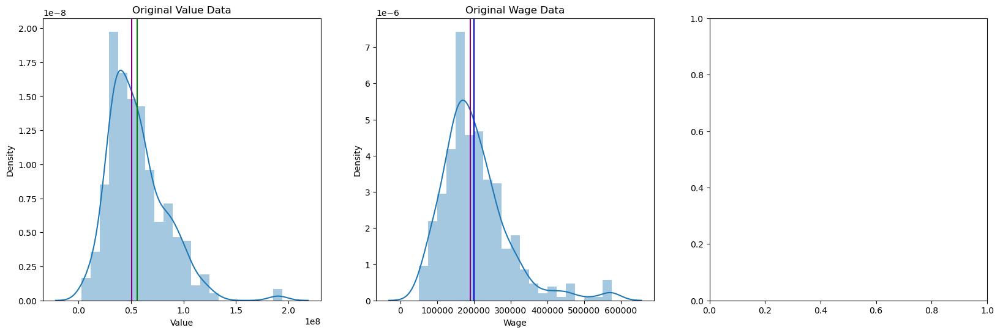

In [10]:

plt.figure(figsize = (55,6))
plt.subplot(181)    # 1= first row, 3= third coloums , 1 = first position.
sns.distplot(d['Value'])
plt.title("Original Value Data")
plt.axvline(d['Value'].mean(), color="green")
plt.axvline(np.median(d['Value']),color="purple")


plt.subplot(182)
sns.distplot(d['Wage'])
plt.title("Original Wage Data")
plt.axvline(d['Wage'].mean(), color="blue")
plt.axvline(np.median(d['Wage']),color="purple")

plt.subplot(183)
sns.distplot(log_data1)
plt.title("Overall Rating Data")
plt.axvline(log_data1.mean(), color="red")
plt.axvline(np.median(log_data1),color="yellow")

plt.subplot(184)
sns.distplot(d["Potential"])
plt.title("Overall Potential Data")
plt.axvline(d["Potential"].mean(), color="red")
plt.axvline(np.median(d["Potential"]),color="yellow")


plt.show()

Markdown
1. This graph gives the details of "Wage","Value" & "Overall_Rating" of players based on the player credibility.
2. This graph shows the Mean & Median values based on the players data which includes the outliners.


### no of player value in no of teams ---> [ 7 - years]

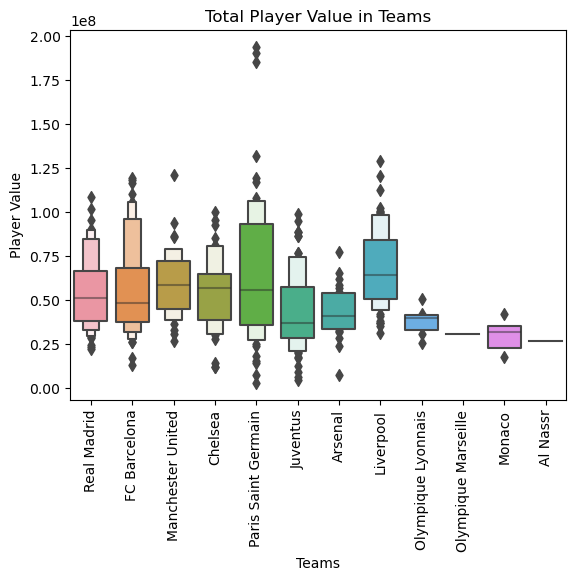

In [11]:
sns.boxenplot( x = "Team", y = "Value", data = d)
plt.title('Total Player Value in Teams')
plt.ylabel('Player Value')
plt.xlabel('Teams')
plt.xticks(rotation = 90)
plt.show()

### no of player wage in no of teams ---> [ 7 - years]

In [40]:
# sns.barplot(x = 'Team', y = 'Wage', data = d, orient = 'v') # h ----> horizontal
# plt.xticks(rotation = 90)                                   # v ----> vertical
# plt.show()

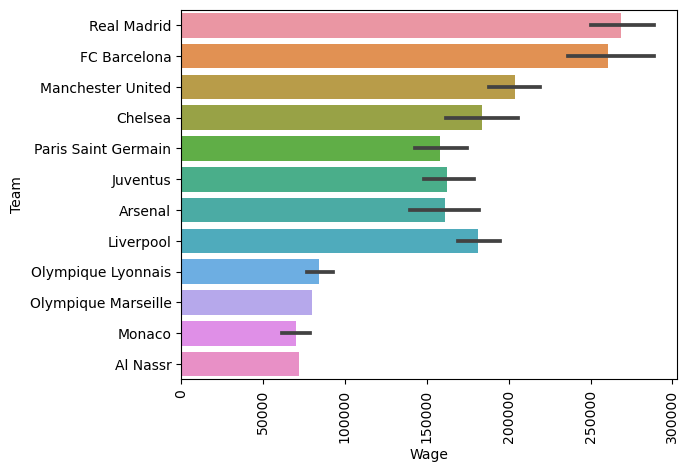

In [12]:
sns.barplot(x = 'Wage', y = 'Team', data = d, orient = 'h') # h ----> horizontal
plt.xticks(rotation = 90)                                   # v ----> vertical
plt.show()

### no of player name in no of age with in the teams ---> [ 7 - years]

In [42]:
# plt.figure(figsize = (55,20))
# plt.xticks(rotation = 60)
# sns.scatterplot(d['Name'],d['Age'],hue = d['Team'])

In [43]:
# INORDER TO IDENTIFY THE NAMES(DETAILS) IN THE GRAPH

In [44]:
import plotly.express as px

In [45]:
px.scatter(d, x = 'Name', y = 'Age', color = 'Team')

In [46]:
px.scatter(d, x = 'Name', y = 'Wage', color = 'Value')

In [47]:
px.scatter(d, x = 'Name', y = 'Value', color = 'Wage')

In [48]:
# px.scatter(d, x = 'Name', y = 'Team', color = 'Contract')

In [49]:
px.scatter(d, x = 'Name', y = 'Contract', color = 'Team')

In [50]:
px.scatter(d, x = 'Wage', y = 'Value', color = 'Team',marginal_x='violin',marginal_y='box',trendline='ols')

In [51]:
dd = {'Name':b,
    'Age':age,
    'Team':team,
    'Contract':Contract,
    'Overall_Rating':rating,
    'Potential':performance,
    'Value':value,
    'Wage':wage}

In [138]:
alpha = d.head(10)
alpha

,Name,Age,Team,Contract,Overall_Rating,Potential,Value,Wage
0,Cristiano Ronaldo,31,Real Madrid,2009 ~ 2021,94,94,87000000.0,575000.0
1,L. Messi,29,FC Barcelona,2004 ~ 2018,93,93,89000000.0,575000.0
2,Neymar,24,FC Barcelona,2013 ~ 2021,92,94,106000000.0,450000.0
3,L. Suárez,29,FC Barcelona,2014 ~ 2021,92,92,83000000.0,525000.0
4,Z. Ibrahimović,34,Manchester United,2016 ~ 2018,90,90,36500000.0,300000.0
5,De Gea,25,Manchester United,2011 ~ 2019,90,92,68500000.0,190000.0
6,G. Bale,26,Real Madrid,2013 ~ 2022,90,90,72000000.0,375000.0
7,L. Modrić,30,Real Madrid,2012 ~ 2020,89,89,54000000.0,325000.0
8,T. Courtois,24,Chelsea,2011 ~ 2019,89,92,65500000.0,170000.0
9,Thiago Silva,31,Paris Saint Germain,2012 ~ 2020,89,89,39500000.0,170000.0


In [140]:
alpha.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Name            10 non-null     object 
 1   Age             10 non-null     int64  
 2   Team            10 non-null     object 
 3   Contract        10 non-null     object 
 4   Overall_Rating  10 non-null     int64  
 5   Potential       10 non-null     int64  
 6   Value           10 non-null     float64
 7   Wage            10 non-null     float64
dtypes: float64(2), int64(3), object(3)
memory usage: 768.0+ bytes


In [141]:
alpha.crosstab(alpha['Value'].alpha['Wage']).plot(kind = 'bar',stacked = True)
plt.title('Team wage details')
plt.xticks(rotation = 60)
plt.show()

AttributeError: 'DataFrame' object has no attribute 'crosstab'

In [60]:
fig = px.parallel_coordinates(d, color="Age", labels={"Age": "age", "Team": "team",
                  "Contract": "Contract", "Overall_Rating": "rating",
                    "Potential": "performance"},
                    color_continuous_scale=px.colors.diverging.Tealrose, color_continuous_midpoint=2)
fig.show()

ValueError: 
    Invalid element(s) received for the 'color' property of parcoords.line
        Invalid elements include: ['31', '29', '24', '29', '34', '25', '26', '30', '24', '31']

    The 'color' property is a color and may be specified as:
      - A hex string (e.g. '#ff0000')
      - An rgb/rgba string (e.g. 'rgb(255,0,0)')
      - An hsl/hsla string (e.g. 'hsl(0,100%,50%)')
      - An hsv/hsva string (e.g. 'hsv(0,100%,100%)')
      - A named CSS color:
            aliceblue, antiquewhite, aqua, aquamarine, azure,
            beige, bisque, black, blanchedalmond, blue,
            blueviolet, brown, burlywood, cadetblue,
            chartreuse, chocolate, coral, cornflowerblue,
            cornsilk, crimson, cyan, darkblue, darkcyan,
            darkgoldenrod, darkgray, darkgrey, darkgreen,
            darkkhaki, darkmagenta, darkolivegreen, darkorange,
            darkorchid, darkred, darksalmon, darkseagreen,
            darkslateblue, darkslategray, darkslategrey,
            darkturquoise, darkviolet, deeppink, deepskyblue,
            dimgray, dimgrey, dodgerblue, firebrick,
            floralwhite, forestgreen, fuchsia, gainsboro,
            ghostwhite, gold, goldenrod, gray, grey, green,
            greenyellow, honeydew, hotpink, indianred, indigo,
            ivory, khaki, lavender, lavenderblush, lawngreen,
            lemonchiffon, lightblue, lightcoral, lightcyan,
            lightgoldenrodyellow, lightgray, lightgrey,
            lightgreen, lightpink, lightsalmon, lightseagreen,
            lightskyblue, lightslategray, lightslategrey,
            lightsteelblue, lightyellow, lime, limegreen,
            linen, magenta, maroon, mediumaquamarine,
            mediumblue, mediumorchid, mediumpurple,
            mediumseagreen, mediumslateblue, mediumspringgreen,
            mediumturquoise, mediumvioletred, midnightblue,
            mintcream, mistyrose, moccasin, navajowhite, navy,
            oldlace, olive, olivedrab, orange, orangered,
            orchid, palegoldenrod, palegreen, paleturquoise,
            palevioletred, papayawhip, peachpuff, peru, pink,
            plum, powderblue, purple, red, rosybrown,
            royalblue, rebeccapurple, saddlebrown, salmon,
            sandybrown, seagreen, seashell, sienna, silver,
            skyblue, slateblue, slategray, slategrey, snow,
            springgreen, steelblue, tan, teal, thistle, tomato,
            turquoise, violet, wheat, white, whitesmoke,
            yellow, yellowgreen
      - A number that will be interpreted as a color
        according to parcoords.line.colorscale
      - A list or array of any of the above

In [99]:
# fig = px.parallel_coordinates(d, color="Value", labels={"Name": "b",
#                   "Age": "Sepal age", "Team": "team",
#                   "Contract": "Contract", "Overall_Rating": "rating",
#                     "Potential": "performance","Value": "value","Wage": "wage"},
#                     color_continuous_scale=px.colors.diverging.Tealrose, color_continuous_midpoint=2)
# fig.show()

In [108]:
# fig = px.parallel_coordinates(d, color="Wage", labels={"Wage": "wage",
#                             "Value": "value"},
#                     color_continuous_scale=px.colors.diverging.Tealrose, color_continuous_midpoint=2)
# fig.show()

In [109]:
# fig = px.parallel_coordinates(d, color="Overall_Rating", labels={"Potential": "performance",
#                             "Overall_Rating": "rating"},
#                     color_continuous_scale=px.colors.diverging.Tealrose, color_continuous_midpoint=2)
# fig.show()

In [101]:
fig = px.density_contour(d, x="Team", y="Overall_Rating")
fig.show()

In [102]:
fig = px.density_contour(d, x="Team", y="Potential")
fig.show()

In [112]:
# fig = px.density_contour(d, x="Team", y="Age")
# fig.show()

In [113]:
# fig = px.density_contour(d, x="Name", y="Age")
# fig.show()

In [114]:
# fig = px.density_contour(d, x="Name", y="Team")
# fig.show()

In [103]:
import plotly.express as px

fig = px.scatter_matrix(d, dimensions=["Age", "Potential", "Overall_Rating", "Wage"], color="Team")
fig.show()

In [104]:
import plotly.express as px

fig = px.bar(d, x="Potential", y="Overall_Rating", color="Team", barmode="group", facet_row="Contract", facet_col="Value",
       category_orders={"Contract": "contract", 
                        "Value": "value"})
fig.show()

ValueError: Horizontal spacing cannot be greater than (1 / (cols - 1)) = 0.005618.
The resulting plot would have 179 columns (cols=179).
Use the facet_col_spacing argument to adjust this spacing.

In [127]:
import plotly.express as px
d = px.data.gapminder().query("Contract == Contract").query("Name == 'Name'")
d.loc[d['Name']  # Represent only large countries
fig = px.pie(d, values='Name', names='Teams', title='Population of European continent')
fig.show()

SyntaxError: invalid syntax (689400961.py, line 4)

### no of names in no of potential ---> [ 7 - years]